<a id='intro'></a>
*To [Table of Contents](#toc)*
# Single Image Super Resolution
## Applied Machine Learning Systems 2
### University College London
#### Department of Electronic and Electrical Engineering
**Student Number:** $20167036$

<img src="./Notebooks/imgs/downscale_compare.png" alt="Drawing" style="height: 400px;"/>

This project focuses on generating *Super Resolution* (SR) images from *Low Resolution* (LR) ones using deep learning techniques. <br>
More specifically, the project aims at applying an improved version of the [FSRCNN model of Dong et al.](https://arxiv.org/abs/1608.00367) to solve the [NTIRE2017 challenge](https://data.vision.ee.ethz.ch/cvl/ntire17/#challenge).

The datasets used for training and evaluating the models may be accessed from the [DIV2K Dataset Website](https://data.vision.ee.ethz.ch/cvl/DIV2K/) 

<a id='toc'></a>
## Table of Contents:
0. [Introduction](#intro)
1. [Loading Data](#load) 
2. [Construct Models](#construct) 
3. [Model Training](#training)
4. [Performance Evaluation](#evaluate)          <br>
    4.1 [Learning Curves](#learning_curves)     <br>
    4.2 [Test Set](#test_set)                   <br>
    4.3 [Visual Inspection](#visual_inspection) <br>
5. [Credits](#credits)



<a id='load'></a>
*Back to [Table of Contents](#toc)*
<img src="./Notebooks/imgs/load.png" alt="Drawing" style="height: 80px;"/>
# 1. Loading Data

Configure the problem settings via a user interface

In [1]:
from Modules import user_interface as ui

In [2]:
### Print a welcome message
print('='*74)
greeting = 'D I V 2 K   -   S U P E R   R E S O L U T I O N'
print(greeting.center(74))
print('='*74)

# Allow user to select problem track and scaling factor
track  = ui.selection_menu('Choose track:', {'1':'Bicubic', 
                                             '2':'Unknown'})

scale = ui.selection_menu('Choose scaling factor:', {'1' : 'Factor x2',
                                                     '2' : 'Factor x3',
                                                     '3' : 'Factor x4'}) 

# Parameterise the problem, use the configuration options to generate variables that can be used to navigate directories etc.
if track is 1: 
    track = 'bicubic'
else: 
    track = 'unknown'

# Keep a numeric and string version of the scaling factor, strings for navigating directories, numeric for possibly scaling patch sizes etc
# Also, dilate kernel in the deconv layer for the low upscaling cases
if scale is 1: 
    scale     =  2
    scale_str = 'X2'
    dilation  =  3   # Kernel size in deconv layer is dilation x scale, i.e. (6,6) for x2 images
elif scale is 2: 
    scale     =  3
    scale_str = 'X3'
    dilation  =  3   # (9,9) for x3 images, should yield same no. of parameters as the original FSRCNN of Dong et al.
else: 
    scale     =  4
    scale_str = 'X4'
    dilation  =  2   # (8,8) for x4 images

# Make user aware of selection
prompt = 'You have chosen the ' + track + ' degradation problem track with ' + scale_str + ' downscaling.'
print('\n'+'='*len(prompt))
print(prompt)

             D I V 2 K   -   S U P E R   R E S O L U T I O N              


Choose track:
-------------
1. Bicubic
2. Unknown
Select by entering number and hit 'RETURN': 1


Choose scaling factor:
----------------------
1. Factor x2
2. Factor x3
3. Factor x4
Select by entering number and hit 'RETURN': 3

You have chosen the bicubic degradation problem track with X4 downscaling.


### Instantiate datahandler
This project uses the [ISR library's datahandler from GitHub](https://idealo.github.io/image-super-resolution/), that generates patches on the fly from a directory, augments them, and limit's how flat (detail-scarce) the cropped patches can be. Further explanation on the workings of the datahandler are provided in the report and the project notebook, `project_notebook.ipynb`, where I was developing my solution and getting acquainted with using the datahandler to generate mini-batches for training.

In [3]:
from ISR.utils import datahandler as ISR_dh

# Define parameters for the training task, patch sizes are scaled with the problem
lr_patch_size = int(128 / scale)  # LR sub-image size: x2 = 64x64, x3 = 42x42, x4 = 32x32
batch_size    = 4                 # Hyper parameter

# Let's now create a datahandler for the training, and point it to the location of the LR and HR images
datahandler = ISR_dh.DataHandler(lr_dir = './Datasets/DIV2K_train_LR_' + track + '/'+ scale_str + '/',
                                 hr_dir = './Datasets/DIV2K_train_HR/',
                                 patch_size = lr_patch_size, 
                                 scale      = scale,
                                 n_validation_samples = 40)

# Generate a validation set
validation_set = datahandler.get_validation_set(batch_size = batch_size)

<a id='construct'></a>
*Back to [Table of Contents](#toc)*
<img src="./Notebooks/imgs/construction.png" alt="Drawing" style="height: 75px;"/>
# 2. Construct Model

The model is constructed as:

\begin{equation}
\operatorname{Conv_1}(5,56,3)-\operatorname{Conv_2}(1,12,56)-4 \times \operatorname{Conv_m}(3,12,12) -\operatorname{Conv_7}(1,56,12) - \operatorname{DeConv_1}(d \times n,3,12)
\end{equation}

Where $n$ is the scale factor of the chosen problem and $d$ is a *dilation coefficient* for the deconvolutional kernel that assumes:

\begin{equation}
d = \begin{cases} 
    3, & \text{if $n \in [2,3]$ }\\
    2, & \text{if $n = 4$}
    \end{cases}
\end{equation}

Stride is $(1,1)$ in all layers except the deconvolutional layer where the stride matches the problem scale factor $n$.

A graphical representation of the model may be seen below.

<img src="./Notebooks/imgs/fsrcnn.png" alt="Drawing" style="height: 250px;"/>

In [4]:
custom_name = str(input("Add a custom name affix to model: "))#'_' + track + '_' + scale_str   # str(input("Add a custom name affix to model: "))

lr_scheduler   = {'initial_value'   : 1e-3 ,  # Although adam is an adaptive optimiser I've tried decaying the lr
                  'decay_factor'    : 0.5  ,  # This decay factor is negligible for the length of sessions I'm running
                  'minimum'         : 1e-7 ,  # The minimum lr that may be assumed
                  'update_interval' : 10    } # Updated every xth epoch 

adam_optimiser = {'beta1'   : 0.9   ,         # Momentum settings
                  'beta2'   : 0.999 , 
                  'epsilon' : 1e-8   }

parameters  = {# Model Structure
               'conv_layers'         : 7, 
               'conv_filters'        : [56, 12, 12, 12, 12, 12, 56],
               'conv_kernel_sizes'   : [(5,5),(1,1),(3,3),(3,3),(3,3),(3,3),(1,1)],
               'conv_strides'        : [(1,1),(1,1),(1,1),(1,1),(1,1),(1,1),(1,1)],
               'deconv_layers'       : 1, 
               'deconv_filters'      : [3],
               'deconv_kernel_sizes' : [(dilation*scale,dilation*scale)], # Deconv kernel size is scaled with problem
               'deconv_strides'      : [(scale,scale)], # The stride of the deconvolutional layer decides the scaling
               
               # Optimiser settings
               'lr_scheduler'        : lr_scheduler, 
               'adam_optimiser'      : adam_optimiser,
               
               # Affix for model name
               'name_affix'          : custom_name} 

Add a custom name affix to model: _MAE


Now, I'll instantiate a model with the parameters from above

In [5]:
from Modules import model as m

model = m.SRCNN(**parameters)
model.model.summary()

Model: "Conv-7_Flt-56-12-12-12-12-12-56_Krnl-55-11-33-33-33-33-11_Strd-11-11-11-11-11-11-11-Deconv-1_Flt-3_Krnl-88_Strd-44_MAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 56)    4256      
_________________________________________________________________
p_re_lu (PReLU)              (None, None, None, 56)    56        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 12)    684       
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, None, None, 12)    12        
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 12)    1308      
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, None, None, 12)    12        
______________

<a id='training'></a>
*Back to [Table of Contents](#toc)*
<img src="./Notebooks/imgs/training.png" alt="Drawing" style="height: 90px;"/>
# 3. Model Training

It's time to train the model, this is done with the `.train()` method of the `SRCNN` class stored in the `model.py` module. <br>
The method generates mini-batches iteratively for the model to train on. <br>
Losses and weight histograms are logged for visualisation with `tensorboard`, instructions on running `tb` are in the `readme.md`<br>

The training pipeline is the following:

<img src="./Notebooks/imgs/pipeline.png" alt="Drawing" style="height: 250px;"/>

If weights have been stored for a given model, they can be loaded.

In [6]:
if ui.yes_no_menu('Load stored model weights (y/n) ? '):
    model.loadWeights()

Load stored model weights (y/n) ? y


User can then run training for $x$ - epochs, the number of steps per epoch can be changed below. <br>
The `ISR` datahandler instance is passed to the trainer.

In [7]:
if ui.yes_no_menu('Train model (y/n) ? '):
    
    epochs = int(input('Number of epochs to run: '))

    print('Training: \n{}'.format(model.model.name))
    model.train(total_epochs    = epochs,
                steps_per_epoch = 200,
                batch_size      = batch_size,
                datahandler     = datahandler,
                validation_set  = validation_set)

Train model (y/n) ? n


<a id='evaluate'></a>
*Back to [Table of Contents](#toc)*
<img src="./Notebooks/imgs/evaluate.png" alt="Drawing" style="height: 80px;"/>
# 4. Performance Evaluation

Now, I visualise the metrics logged in the model, this is ofcourse also accessible on the `tensorboard`

<a id='learning_curves'></a>
*Back to [Table of Contents](#toc)*
## 4.1 Learning Curves

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme()

Let's visualise this model's training history, the validation losses are stored in the model

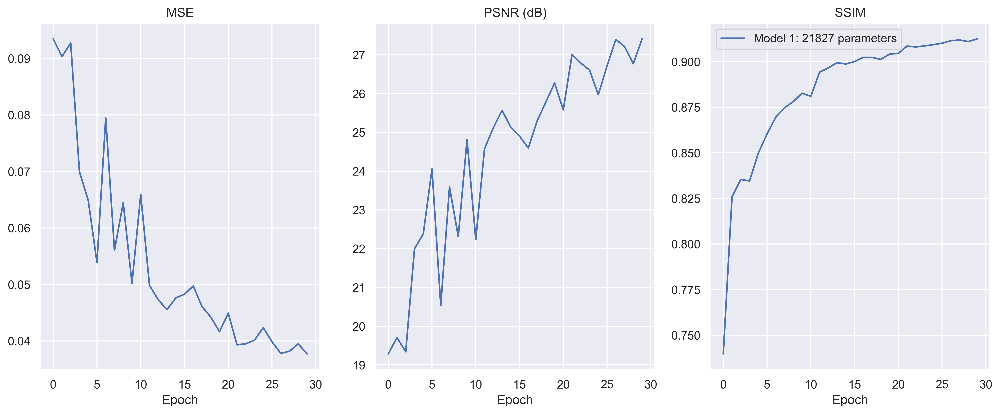

In [9]:
fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(16,6),dpi=400)

metrics = ['val_loss', 'val_psnr'  , 'val_ssim']
names   = ['MSE'     , 'PSNR (dB)' , 'SSIM'    ]

for plot,metric,name in zip(ax.ravel(),metrics,names):
    plot.plot(model.val_history[metric])
    plot.set_title(name)
    plot.set_xlabel('Epoch')

plt.legend(['Model 1: ' + str(model.model.count_params()) + ' parameters'])
plt.show()

<a id='test_set'></a>
*Back to [Table of Contents](#toc)*
## 4.2 Test Set

Now we can verify the performance on the test set, i.e. the 100 validation images of `DIV2K`

In [10]:
from Modules import data_processing as dp
from Modules import metrics

In [11]:
x_test = dp.loadImages(directory       = './Datasets/DIV2K_valid_LR_' + track + '/'+ scale_str + '/',
                       file_extension  = '.png',
                       loading_message = 'Loading '+ scale_str + ' ' + track + ' downsampled testing images \t')
y_test = dp.loadImages(directory       = './Datasets/DIV2K_valid_HR/',
                       file_extension  = '.png',
                       loading_message = 'Loading high resolution testing images \t\t')

Found 100 in directory
Loading X4 bicubic downsampled testing images 	 |████████████████████| 100.0% 
Found 100 in directory
Loading high resolution testing images 		 |████████████████████| 100.0% 


Reshape the images into tensors using our data processing module

In [12]:
x_test = dp.reshapeImgs(x_test)
y_test = dp.reshapeImgs(y_test)

Test set is now loaded, I'll create a `pandas` dataframe to hold my evaluation metrics.

In [13]:
import pandas as pd

In [14]:
validate = ui.yes_no_menu('Validate on 100 fullsize test images? \nThis might take a couple of minutes (y/n)')
if validate:
    results = pd.DataFrame() # Create dataframe for the evaluation scores

    # Perform image quality assessment for every test sample from the DIV2K validation set
    for sample,label in zip(x_test, y_test):

        y_pred  = model.model.predict(sample)               # Predict on the fullsize image
        y_pred[y_pred > 1] = 1                              # Constrain predictions to the interval [0,1]
        y_pred[y_pred < 0] = 0
        scores = metrics.evaluate(y_pred[0], label[0])      # Get a MSE, PSNR and SSIM score dictionary

        results = results.append(scores, ignore_index=True) # Append the score dictionary to the dataframe

Validate on 100 fullsize test images? 
This might take a couple of minutes (y/n)n


**Test set results**<br>
Now, what's the verdict ?

In [15]:
if validate:
    print(results.mean())

What are the worst and best predictions?

In [16]:
if validate:
    print("Best prediction was on image:  \t{}.png\nWith PSNR score: \t\t{:.2f} dB".format(str(results['PSNR'].idxmax()+801).zfill(4) , results['PSNR'].max()))
    print("Worst prediction was on image: \t{}.png\nWith PSNR score: \t\t{:.2f} dB".format(str(results['PSNR'].idxmin()+801).zfill(4) , results['PSNR'].min()))

In [17]:
results['img'] = results.index + 801

NameError: name 'results' is not defined

In [ ]:
843

In [ ]:
results.PSNR[results.PSNR>31]

<a id='visual_inspection'></a>
*Back to [Table of Contents](#toc)*
## 4.3 Visual Inspection 

Now, I've taken aside a couple of $\times 2, \times 3, \times 4$ *bicubic* and *unknown* downscaled image and their `HR` counterparts, to perform visual inspection of the super-resolved image quality, e.g. if we're seeing checkerboard patterns in the reconstruction etc.

There are three images the directory, you can set `img_no` to `0`, `1` or `2` to look at other examples

In [18]:
img_no = 3

In [19]:
test_img  = dp.loadImages(directory       = './Datasets/Evaluate/' + track + '/'+ scale_str + '/',
                          file_extension  = '.png',
                          loading_message = 'Loading Test Images \t\t')
real_img  = dp.loadImages(directory       = './Datasets/Evaluate/HR/',
                          file_extension  = '.png',
                          loading_message = 'Loading Ground Truth Images \t')

Found 4 in directory
Loading Test Images 		 |████████████████████| 100.0% 
Found 4 in directory
Loading Ground Truth Images 	 |████████████████████| 100.0% 


In [20]:
test_tensor      = dp.reshapeImgs(test_img)
pred_tensor      = model.model.predict(test_tensor[img_no])
pred_tensor_list = [pred_tensor]
pred_img         = dp.reshapeTensor(pred_tensor_list)

# Constrain prediction to the [0,1] interval
pred_img[0][pred_img[0] > 1] = 1
pred_img[0][pred_img[0] < 0] = 0

# Make the original image comparable with predicted image, i.e. fit to [0,1] interval
real_img[img_no] = real_img[img_no]/255

# Evaluate MSE, PSNR and SSIM between the original and super-resolved image
image_score = metrics.evaluate(real_img[img_no],pred_img[0])

/opt/anaconda3/envs/AMLS_II_Final/lib/python3.6/site-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


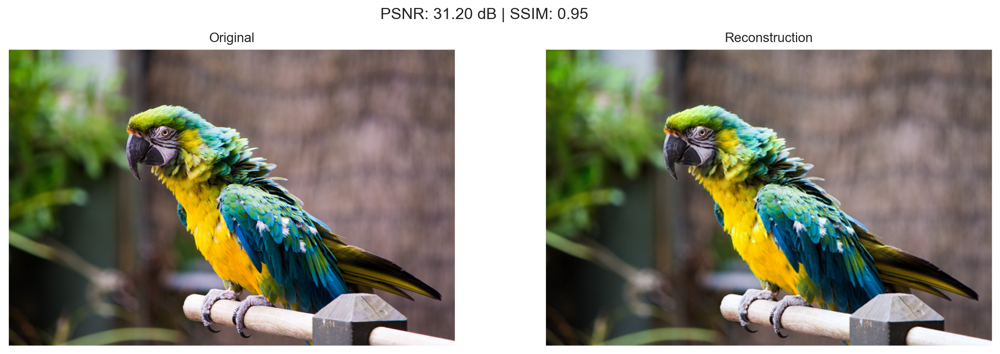

In [21]:
fig,ax = plt.subplots(1,2,figsize=(16,5),sharex=True,sharey=True,dpi=200)
ax[0].imshow(real_img[img_no])
ax[0].set_title('Original')
ax[1].imshow(pred_img[0])
ax[1].set_title('Reconstruction')
plt.suptitle('PSNR: {:.2f} dB | SSIM: {:.2f}'.format(image_score['PSNR'],image_score['SSIM']))
plt.xticks([])
plt.yticks([])
plt.show()

This is the `LR` image:

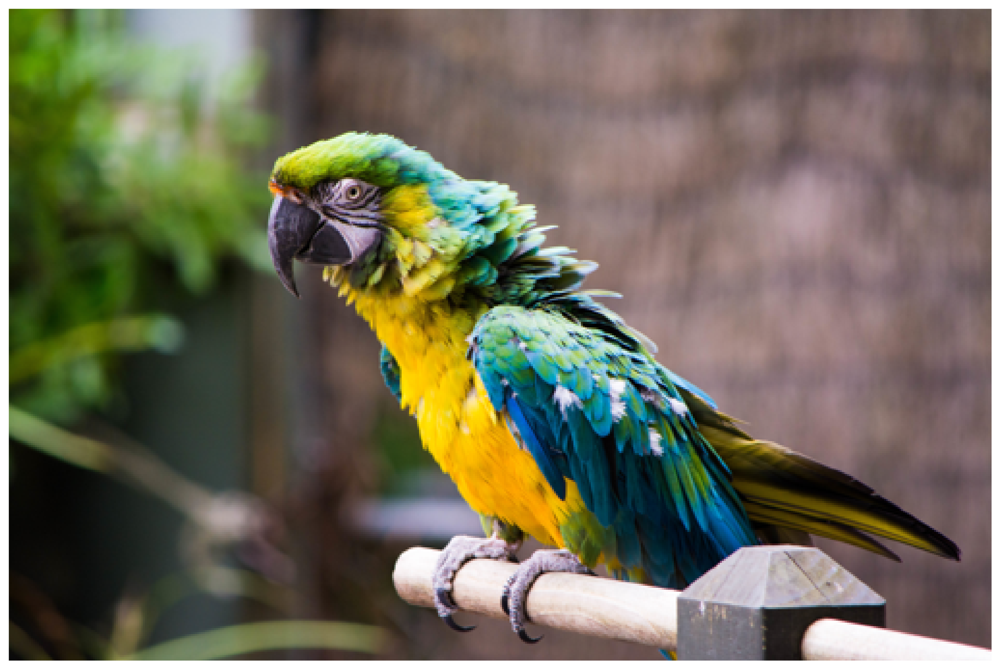

In [22]:
import numpy as np
b,h,w,ch = test_img[img_no].shape
test_img[img_no] = np.reshape(test_img[img_no],(h,w,ch))
plt.figure(figsize=(16,16),dpi=200)
plt.imshow(test_img[img_no])
plt.xticks([])
plt.yticks([])
plt.show()

This is the `predicted` image:

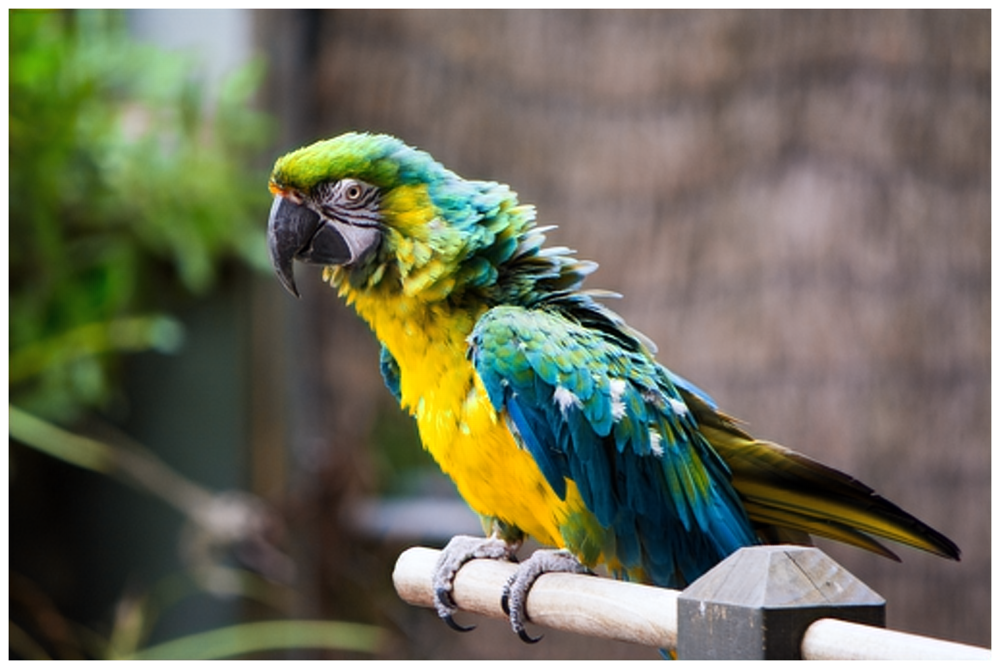

In [25]:
plt.figure(figsize=(16,16),dpi=600)
plt.imshow(pred_img[0])
plt.xticks([])
plt.yticks([])
plt.show()

This is the `HR` image:

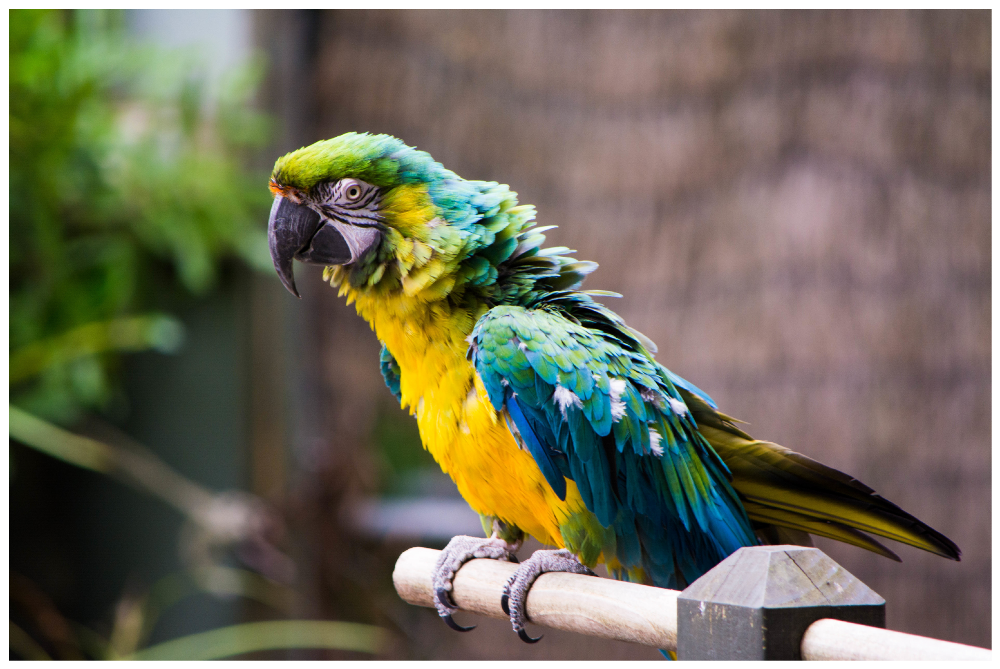

In [24]:
plt.figure(figsize=(16,16),dpi=200)
plt.imshow(real_img[img_no])
plt.xticks([])
plt.yticks([])
plt.show()

# <a id='credits'></a>
*Back to [Table of Contents](#toc)*
<img src="./Notebooks/imgs/credits.png" alt="Drawing" style="height: 80px;"/>
# 5. Credits


Chapter Title Icons: <a href="www.flaticon.com">Flaticon.com</a>. <br>
This notebook has been designed using resources from <a href="www.flaticon.com">Flaticon.com </a> <br>
Datahandler is from the [ISR library, accessible on GitHub](https://idealo.github.io/image-super-resolution/)